
 # **<font color='blue'>Ses LA8: : Deepfake image detection with deep learning models</font>**

  #<font color='blue'>**Which one is real?**</font>

---






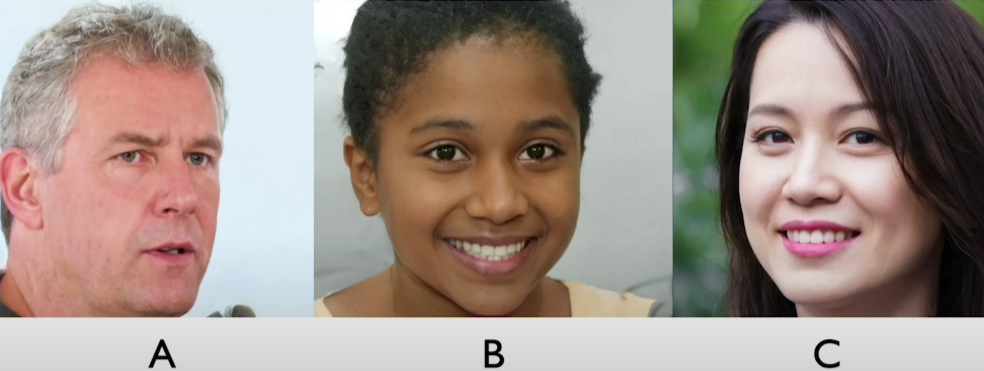

##### Image courtesy: http://introtodeeplearning.com

# <font color='blue'>**Deep Fake = Deep Learning + Fake**</font>

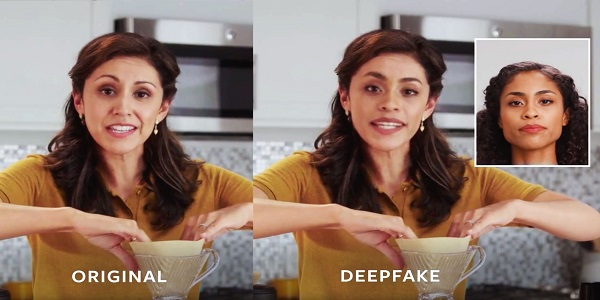

# <font color='blue'>**Positive Impacts**</font>

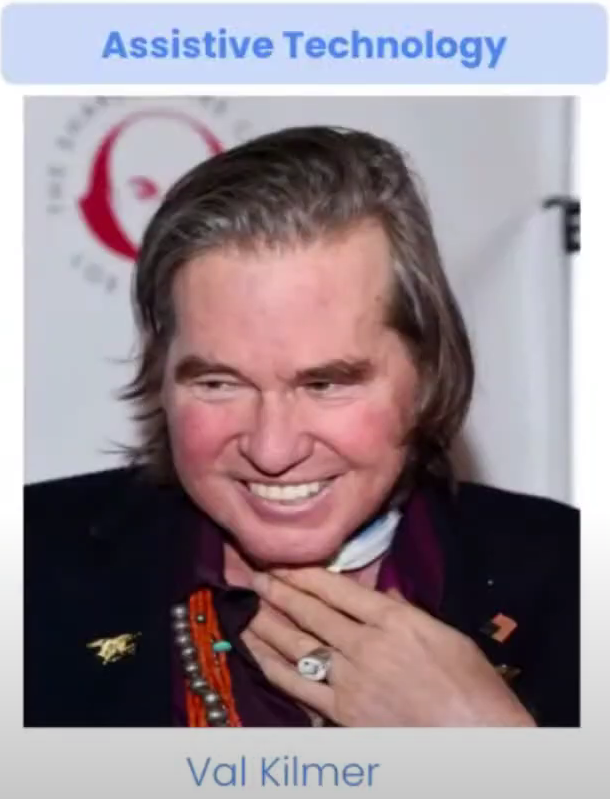


https://www.youtube.com/watch?v=OSMue60Gg6s

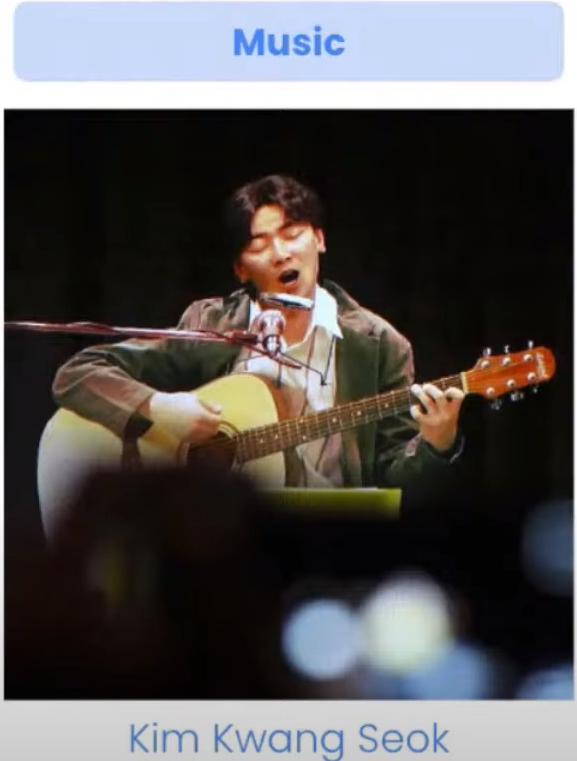

https://www.youtube.com/watch?v=HhyUipP-a2I

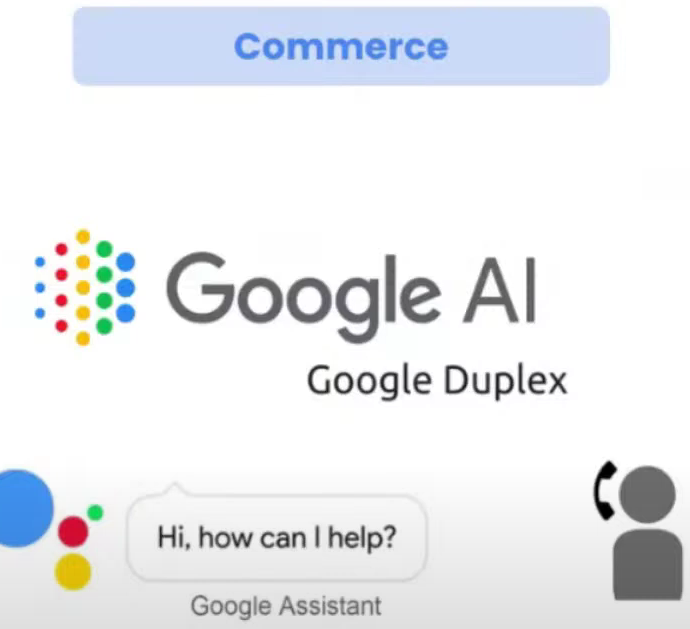

# <font color='blue'>**Negative Impacts**</font>





---

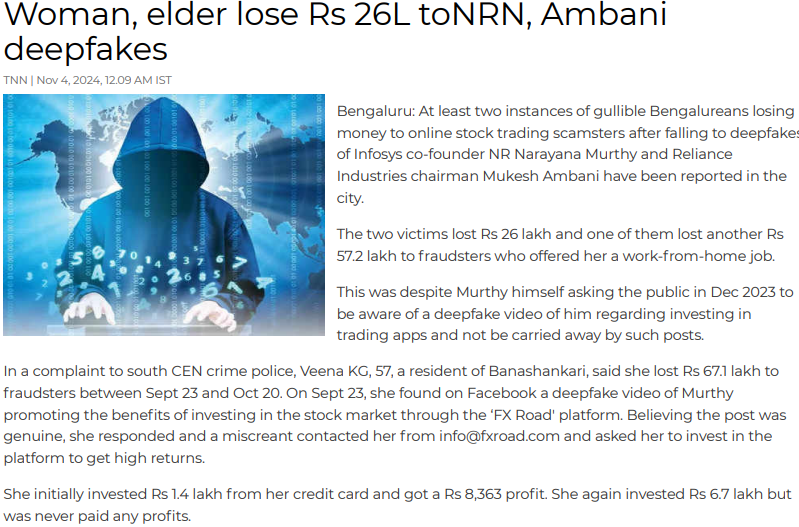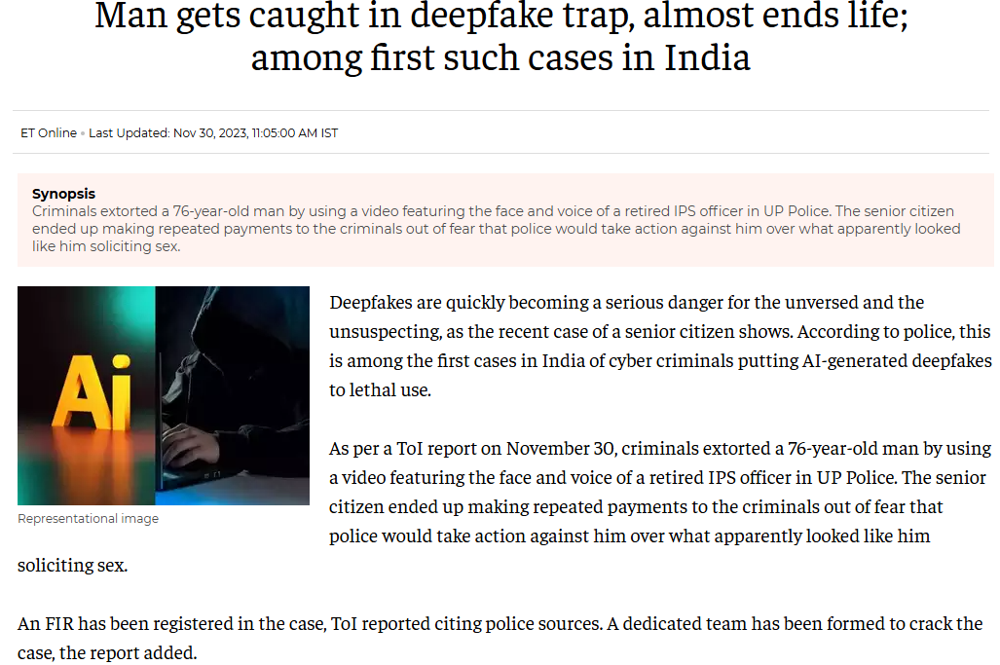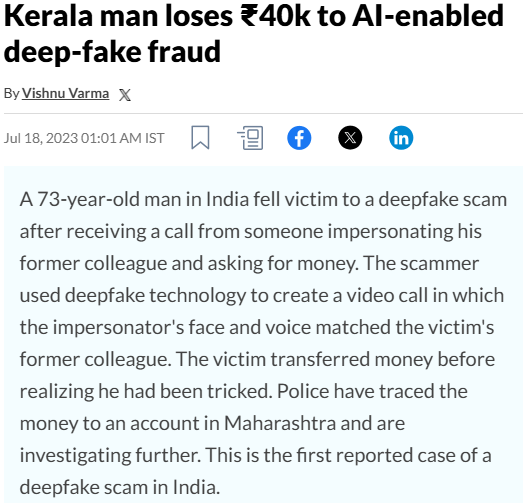

# <font color='blue'>**Available Datasets**<font>



*   **FaceForensics++**: is a forensics dataset consisting of 1000 original video sequences that have been manipulated with four automated face manipulation methods: Deepfakes, Face2Face, FaceSwap and NeuralTextures.

*   **DFDC:** The Deepfake Detection Challenge is a dataset for deepface detection consisting of more than 100,000 videos. The DFDC dataset consists of two versions:
  * Preview dataset. with 5k videos. Featuring two facial modification algorithms.
  * Full dataset, with 124k videos. Featuring eight facial modification algorithms.

* **Celeb-DF:** is a large-scale challenging dataset for deepfake forensics. It includes 590 original videos collected from YouTube with subjects of different ages, ethnic groups and genders, and 5639 corresponding DeepFake videos.

* **DeeperForensics-1.0**: represents the largest face forgery detection dataset by far, with 60,000 videos constituted by a total of 17.6 million frames, 10 times larger than existing datasets of the same kind. The full dataset includes 48,475 source videos and 11,000 manipulated videos. The source videos are collected on 100 paid and consented actors from 26 countries, and the manipulated videos are generated by a newly proposed many-to-many end-to-end face swapping method, DF-VAE. 7 types of real-world perturbations at 5 intensity levels are employed to ensure a larger scale and higher diversity.

* **OpenForensics**: is a large-scale dataset posing a high level of challenges that is designed with face-wise rich annotations explicitly for face forgery detection and segmentation. With its rich annotations, the OpenForensics dataset has great potentials for research in both deepfake prevention and general human face detection. **This dataset contains various backgrounds and multiple people of various ages, genders, poses, positions, and face occlusions.**

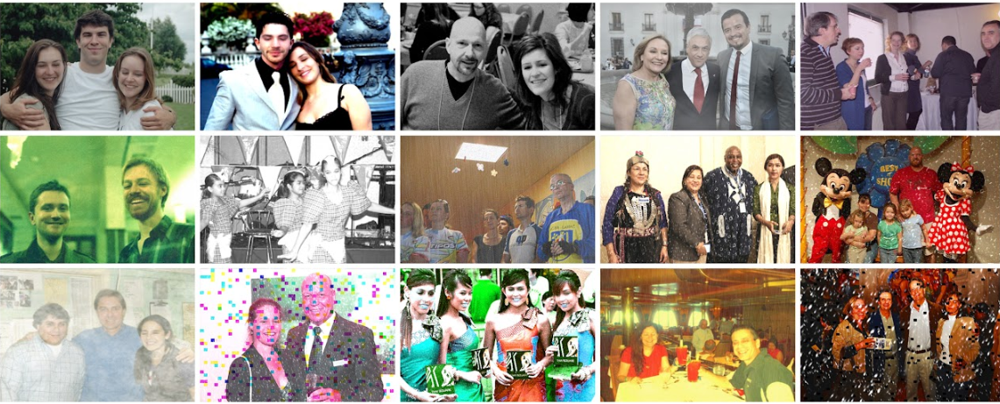

# **Reading Dataset**
* OpenForensics (https://www.google.com/url?q=https%3A%2F%2Fzenodo.org%2Frecord%2F5528418&sa=D&sntz=1&usg=AOvVaw28OUp21-HL6apkIguBezUU)

Google Drive Link: https://drive.google.com/drive/folders/11eFj4Byusj_-CsdbYW7-uS-fCmUNk5yp?usp=sharing

In [ ]:
from zipfile import ZipFile
with ZipFile("/content/drive/MyDrive/FDP IIITDMJ/Sample Data.zip", 'r') as zObject:

    zObject.extractall(
        path="/content/drive/MyDrive/FDP IIITDMJ")

In [1]:
import os
import shutil
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define dataset path
dataset_dir = '/kaggle/input/star-gan/Star_Test'  # Replace with the path to your dataset
base_dir = '/kaggle/working/split_dataset'  # Path where split datasets will be saved

# Parameters
train_ratio = 0.8
validation_ratio = 0.1
test_ratio = 0.1
img_height, img_width = 128, 128
batch_size = 32

# Create directories for train, validation, and test sets
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

# Function to split dataset
def split_dataset(dataset_dir, train_dir, validation_dir, test_dir, train_ratio, validation_ratio):
    if not os.path.exists(base_dir):
        os.makedirs(base_dir)
    if not os.path.exists(train_dir):
        os.makedirs(train_dir)
    if not os.path.exists(validation_dir):
        os.makedirs(validation_dir)
    if not os.path.exists(test_dir):
        os.makedirs(test_dir)

    for class_name in os.listdir(dataset_dir):
        class_dir = os.path.join(dataset_dir, class_name)
        if not os.path.isdir(class_dir):
            continue

        # Create class subdirectories
        train_class_dir = os.path.join(train_dir, class_name)
        validation_class_dir = os.path.join(validation_dir, class_name)
        test_class_dir = os.path.join(test_dir, class_name)

        os.makedirs(train_class_dir, exist_ok=True)
        os.makedirs(validation_class_dir, exist_ok=True)
        os.makedirs(test_class_dir, exist_ok=True)

        # Shuffle and split files
        files = os.listdir(class_dir)
        random.shuffle(files)
        num_train = int(train_ratio * len(files))
        num_val = int(validation_ratio * len(files))

        train_files = files[:num_train]
        val_files = files[num_train:num_train + num_val]
        test_files = files[num_train + num_val:]

        # Move files to respective directories
        for file in train_files:
            shutil.copy(os.path.join(class_dir, file), os.path.join(train_class_dir, file))
        for file in val_files:
            shutil.copy(os.path.join(class_dir, file), os.path.join(validation_class_dir, file))
        for file in test_files:
            shutil.copy(os.path.join(class_dir, file), os.path.join(test_class_dir, file))

# Split the dataset
split_dataset(dataset_dir, train_dir, validation_dir, test_dir, train_ratio, validation_ratio)

# **Image_dataset_from_directory:**
## image_dataset_from_directory is a high-level TensorFlow function that simplifies the process of loading and preparing image datasets for machine learning models. It automatically creates a tf.data.Dataset object from a directory of images organized by subdirectories representing class labels.

In [25]:
import os
import tensorflow as tf

def get_from_dir(dir):
    global path
    dir = os.path.join(path,dir)
    return tf.keras.utils.image_dataset_from_directory(dir,
           color_mode="rgb",
           batch_size=32,
           image_size=(128, 128))
path = "/kaggle/input/deep-fake-dataset/OpenForensics"
train = get_from_dir("Train")
test = get_from_dir("Test")
val = get_from_dir("Validation")

Found 140002 files belonging to 2 classes.
Found 10905 files belonging to 2 classes.
Found 39428 files belonging to 2 classes.


# **Visualization of Sample Images of OpenForensics Dataset**

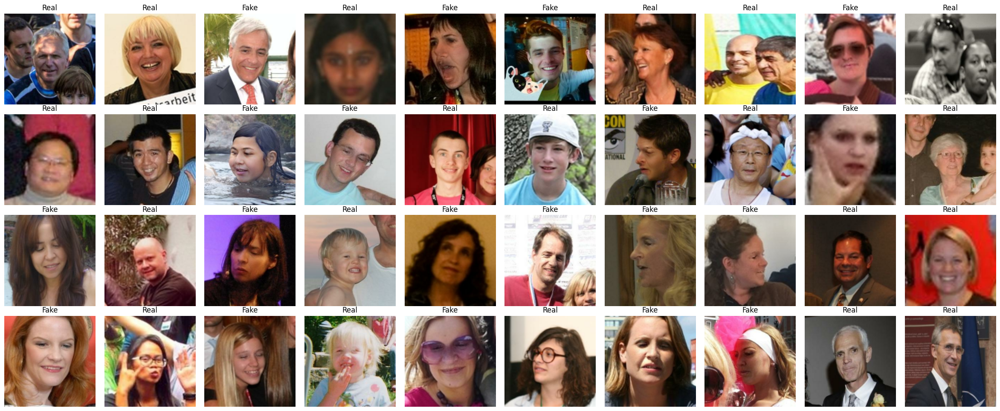

In [27]:
import numpy as np
from matplotlib import pyplot as plt

class_names = np.unique(train.class_names)

n_rows = 4
n_cols = 10
plt.figure(figsize=(n_cols * 3, n_rows * 3))
data = list(train.take(n_rows*n_cols))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        
        single_image = data[index][0][0]  
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(single_image.numpy().astype("uint8"),cmap="gray")  
        plt.axis('off')
      
        label_index = data[index][1][0]
        plt.title(class_names[label_index], fontsize=12)
plt.subplots_adjust(wspace=0.1, hspace=0.1)
plt.show()

# **Model**

In [39]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense,Input, MaxPooling2D, GlobalAveragePooling2D, Dropout, Concatenate, Activation, BatchNormalization,Add, GlobalMaxPooling2D, Conv2D,Multiply, Softmax
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

class SelfAttention(tf.keras.layers.Layer):
    def __init__(self, channels, **kwargs):
        super(SelfAttention, self).__init__(**kwargs)
        self.channels = channels
        self.query_conv = Conv2D(filters=channels // 8, kernel_size=1, padding='same')
        self.key_conv = Conv2D(filters=channels // 8, kernel_size=1, padding='same')
        self.value_conv = Conv2D(filters=channels, kernel_size=1, padding='same')
        self.gamma = self.add_weight(name='gamma', shape=(1,), initializer='zeros', trainable=True)

    def call(self, inputs):
        # Extract spatial dimensions
        batch_size, height, width, channels = tf.shape(inputs)[0], tf.shape(inputs)[1], tf.shape(inputs)[2], tf.shape(inputs)[3]

        # Compute Query, Key, and Value
        query = self.query_conv(inputs)  # Shape: (batch_size, height, width, channels//8)
        key = self.key_conv(inputs)      # Shape: (batch_size, height, width, channels//8)
        value = self.value_conv(inputs)  # Shape: (batch_size, height, width, channels)

        # Reshape to (batch_size, N, C) where N = height * width
        query = tf.reshape(query, [batch_size, -1, self.channels // 8])
        key = tf.reshape(key, [batch_size, -1, self.channels // 8])
        value = tf.reshape(value, [batch_size, -1, self.channels])

        # Attention mechanism
        attention = tf.matmul(query, key, transpose_b=True)  # Shape: (batch_size, N, N)
        attention = Softmax(axis=-1)(attention)              # Normalize attention scores

        # Weighted sum of value
        attention_output = tf.matmul(attention, value)  # Shape: (batch_size, N, channels)
        attention_output = tf.reshape(attention_output, [batch_size, height, width, channels])  # Reshape back

        # Apply gamma to the attention output
        output = self.gamma * attention_output + inputs

        return output

    def get_config(self):
        config = super(SelfAttention, self).get_config()
        config.update({'channels': self.channels})
        return config

input1 =  Input((128, 128, 3))
x1 = Conv2D(32,(3,3),activation="relu", padding='same')(input1)
x2 = Conv2D(32,(3,3),activation="relu", padding='same')(x1)
m1 = MaxPooling2D((2,2), strides=(2, 2))(x2)

x3 = Conv2D(64,(3,3),activation="relu", padding='same')(m1)
x4 = Conv2D(64,(3,3),activation="relu", padding='same')(x3)
m2 = MaxPooling2D((2,2), strides=(2, 2))(x4)

x5 = Conv2D(128,(3,3),activation="relu", padding='same')(m2)
x6 = Conv2D(128,(3,3),activation="relu", padding='same')(x5)
x = MaxPooling2D((2,2), strides=(2, 2))(x6)
g1 = GlobalAveragePooling2D()(x)

#Spatial Attention
x1 = GlobalAveragePooling2D()(x)
x2 = GlobalMaxPooling2D()(x)
c = Concatenate()([x1, x2])
d = Dense(128)(c)
s = Activation("sigmoid")(d)


sattention = SelfAttention(channels=128)(x)
g2 = GlobalAveragePooling2D()(sattention)
m = Multiply()([g2, s])
a = Add()([m, g2])
a1 = Add()([a, g1])
s1 = Dense(1, activation='sigmoid')(a1)
model = Model(inputs=input1, outputs=s1)
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])
model.summary()

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_20      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_125 (Conv2D) │ (None, 128, 128,  │        896 │ input_layer_20[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_126 (Conv2D) │ (None, 128, 128,  │      9,248 │ conv2d_125[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_6     │ (None, 64, 64,    │          0 │ conv2d_126[0][0]  │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_127 (Conv2D) │ (None, 64, 64,    │     18,496 │ max_pooling2d_6[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_128 (Conv2D) │ (None, 64, 64,    │     36,928 │ conv2d_127[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_7     │ (None, 32, 32,    │          0 │ conv2d_128[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_129 (Conv2D) │ (None, 32, 32,    │     73,856 │ max_pooling2d_7[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_130 (Conv2D) │ (None, 32, 32,    │    147,584 │ conv2d_129[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 16, 16,    │          0 │ conv2d_130[0][0]  │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ max_pooling2d_8[… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_max_pooling… │ (None, 128)       │          0 │ max_pooling2d_8[… │
│ (GlobalMaxPooling2… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_18      │ (None, 256)       │          0 │ global_average_p… │
│ (Concatenate)       │                   │            │ global_max_pooli… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ self_attention_18   │ (None, 16, 16,    │     20,641 │ max_pooling2d_8[… │
│ (SelfAttention)     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_17 (Dense)    │ (None, 128)       │     32,896 │ concatenate_18[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ self_attention_1… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_18       │ (None, 128)       │          0 │ dense_17[0][0]    │
│ (Activation)        │                   │            │                 

 Total params: 340,674 (1.30 MB)

 Trainable params: 340,674 (1.30 MB)

 Non-trainable params: 0 (0.00 B)

In [19]:
# from keras.layers import Dense, Conv2D, MaxPooling2D, Input, Flatten, Dropout
# from keras.models import Model

# input1 =  Input((128, 128, 3))
# x1 = Conv2D(32,(3,3),activation="relu", padding='same')(input1)
# x2 = Conv2D(32,(3,3),activation="relu", padding='same')(x1)
# m1 = MaxPooling2D((2,2), strides=(2, 2))(x2)

# x3 = Conv2D(64,(3,3),activation="relu", padding='same')(m1)
# x4 = Conv2D(64,(3,3),activation="relu", padding='same')(x3)
# m2 = MaxPooling2D((2,2), strides=(2, 2))(x4)

# x5 = Conv2D(128,(3,3),activation="relu", padding='same')(m2)
# x6 = Conv2D(128,(3,3),activation="relu", padding='same')(x5)
# m3 = MaxPooling2D((2,2), strides=(2, 2))(x6)

# f = Flatten()(m3)
# d1 = Dense(128,activation="relu")(f)
# d1 = Dropout(0.5)(d1)
# d2 = Dense(256,activation="relu")(d1)
# d3 = Dense(1,activation="sigmoid")(d2)
# model = Model(inputs=input1, outputs=d3)
# model.summary()

# **Training**

In [40]:
import keras
from keras.callbacks import EarlyStopping, ModelCheckpoint

# model.compile('adam', loss=tf.keras.losses.BinaryCrossentropy(), metrics=['accuracy'])

early_stopping_cb = keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)

checkpoint = ModelCheckpoint('/kaggle/working/'+'-{epoch:02d}.keras', monitor='val_loss', save_best_only=True)

history = model.fit(train, epochs=50, batch_size=16, validation_data=val, callbacks=[early_stopping_cb, checkpoint], shuffle  = True)

Epoch 1/50
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 190s 42ms/step - accuracy: 0.5804 - loss: 0.9064 - val_accuracy: 0.6112 - val_loss: 0.8083
Epoch 2/50
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 189s 43ms/step - accuracy: 0.8080 - loss: 0.4132 - val_accuracy: 0.8688 - val_loss: 0.3163
Epoch 3/50
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 188s 43ms/step - accuracy: 0.8996 - loss: 0.2475 - val_accuracy: 0.8758 - val_loss: 0.2955
Epoch 4/50
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 187s 43ms/step - accuracy: 0.9078 - loss: 0.2307 - val_accuracy: 0.8942 - val_loss: 0.2617
Epoch 5/50
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 187s 43ms/step - accuracy: 0.9152 - loss: 0.2122 - val_accuracy: 0.8993 - val_loss: 0.2653
Epoch 6/50
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 188s 43ms/step - accuracy: 0.9186 - loss: 0.2066 - val_accuracy: 0.9125 - val_loss: 0.2205
Epoch 7/50
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 183s 42ms/step - accuracy: 0.7849 - loss: 0.3968 - val_accuracy: 0.8933 - val_loss: 0.2726
Epoch 8/50
4376/4376 ━━━━━━━━━━━━━━━━━━━━ 183s 42ms/step - accuracy: 

# **Loading the Saved Models**

# **Visualization of Accuracy and Loss over each epoch of Training and Validation**

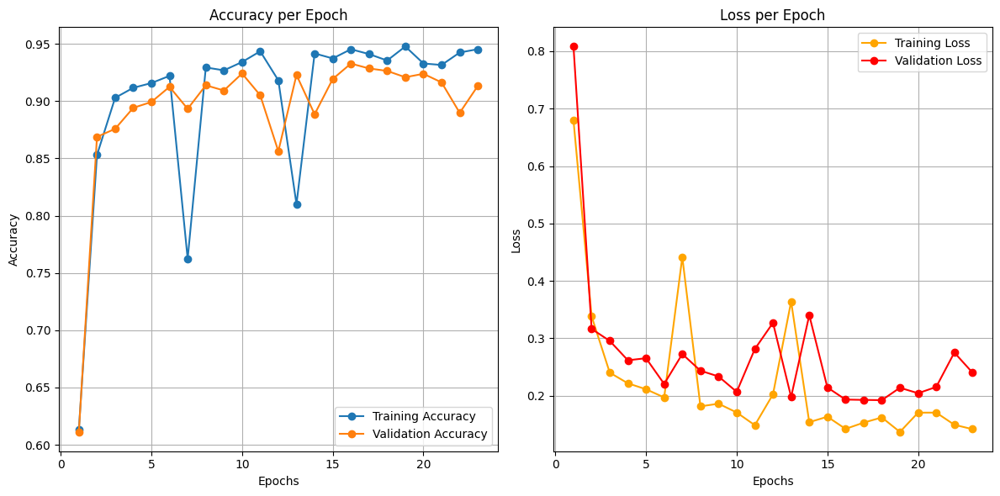

In [42]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history.get('val_accuracy')  
    loss = history.history['loss']
    val_loss = history.history.get('val_loss')  

    epochs = range(1, len(acc) + 1)

    # Plot accuracy
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, label='Training Accuracy', marker='o')
    if val_acc:
        plt.plot(epochs, val_acc, label='Validation Accuracy', marker='o')
    plt.title('Accuracy per Epoch')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Plot loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, label='Training Loss', marker='o', color='orange')
    if val_loss:
        plt.plot(epochs, val_loss, label='Validation Loss', marker='o', color='red')
    plt.title('Loss per Epoch')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_training_history(history)

# **Model Evaluation on Test Set**

In [56]:
loss, accuracy = model.evaluate(test)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

341/341 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9003 - loss: 0.2591
Test Loss: 0.25691527128219604
Test Accuracy: 0.9026134610176086


# **Model Prediction on Test Set**

In [57]:
# Generate predictions
predictions = model.predict(test)

# If the model outputs probabilities, convert them to class indices
predicted_classes = predictions.argmax(axis=1)  

341/341 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step


In [58]:
test.class_names

['Fake', 'Real']

In [59]:
# type(test)

# **Classification Report**

In [60]:
from sklearn.metrics import classification_report

true_labels = []
predictions = []

for images, labels in test:
    true_labels.extend(labels.numpy())
    batch_predictions = model.predict(images) >= 0.5
    predictions.extend(batch_predictions.astype(int).flatten())

true_labels = np.array(true_labels)
predictions = np.array(predictions)

# Generate a classification report
report = classification_report(true_labels, predictions, target_names=test.class_names)
print(report)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━

# **Confusion Matrix**

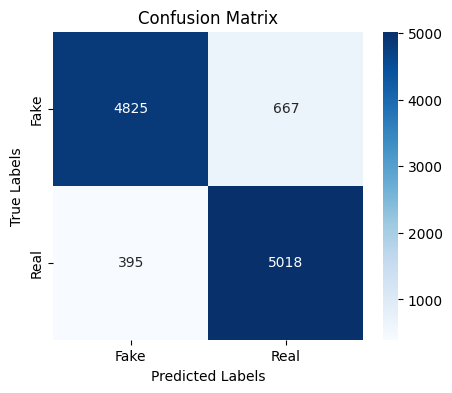

In [61]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Compute confusion matrix
cm = confusion_matrix(true_labels, predictions)

# Plot confusion matrix
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test.class_names, yticklabels=test.class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# **Normalized Confusion Matrix**

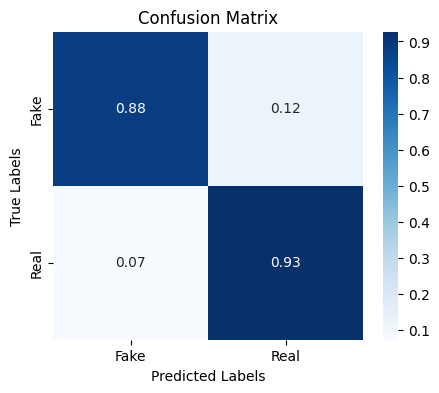

In [62]:
cm = cm.astype('float')/cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=test.class_names, yticklabels=test.class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# **ROC Curve**

Youden's J Statistic:
𝐽 = 𝑇𝑃𝑅 − 𝐹𝑃𝑅

Where:

TPR (True Positive Rate) or Recall is the proportion of actual positives that are correctly identified:
𝑇𝑃𝑅 = True Positives /(True Positives + False Negatives)

 
FPR (False Positive Rate) is the proportion of actual negatives that are incorrectly classified as positives:
𝐹𝑃𝑅 = False Positives/ (False Positives + True Negatives)

​


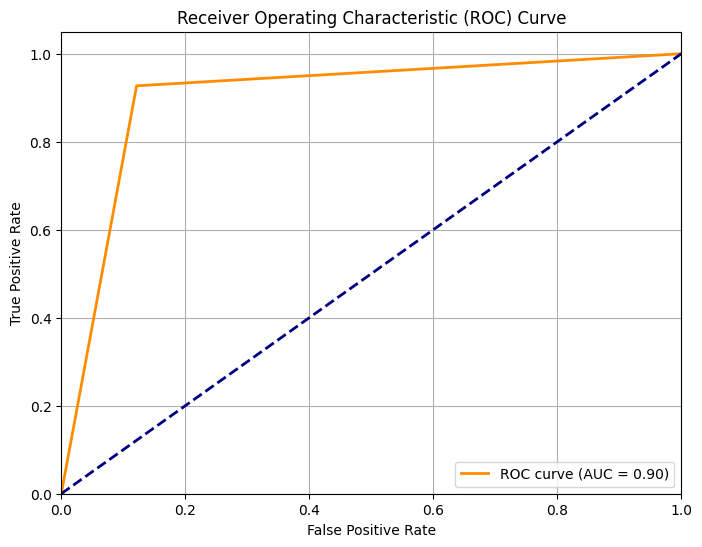

In [63]:
from sklearn.metrics import roc_curve, auc

fpr, tpr, thresholds = roc_curve(true_labels, predictions)

# Compute the AUC
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Random classifier
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.savefig('/kaggle/working/ROC.pdf')
plt.show()

# **Testing DFFD Test Set**

In [64]:
def get_from_dir(dir):
    return tf.keras.utils.image_dataset_from_directory(dir,
           color_mode="rgb",
           batch_size=32,
           image_size=(128, 128))
    
dffd_test = get_from_dir("/kaggle/input/star-gan/Star_Test")

Found 4957 files belonging to 2 classes.


In [65]:
loss, accuracy = model.evaluate(dffd_test)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

155/155 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - accuracy: 0.9512 - loss: 0.1607
Test Loss: 0.16239529848098755
Test Accuracy: 0.9477506279945374


In [66]:
true_labels = []
predictions = []

for images, labels in dffd_test:
    true_labels.extend(labels.numpy())
    batch_predictions = model.predict(images) >= 0.5
    predictions.extend(batch_predictions.astype(int).flatten())

true_labels = np.array(true_labels)
predictions = np.array(predictions)

# Generate a classification report
report = classification_report(true_labels, predictions, target_names=dffd_test.class_names)
print(report)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

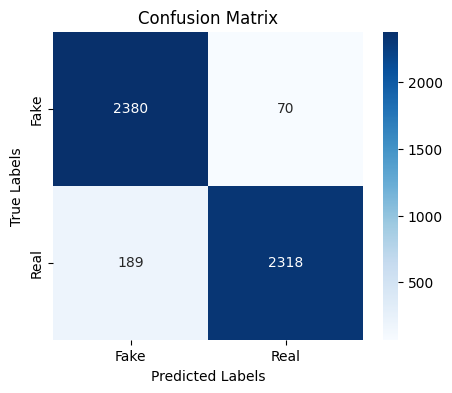

In [67]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Compute confusion matrix
cm = confusion_matrix(true_labels, predictions)

# Plot confusion matrix
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=dffd_test.class_names, yticklabels=dffd_test.class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

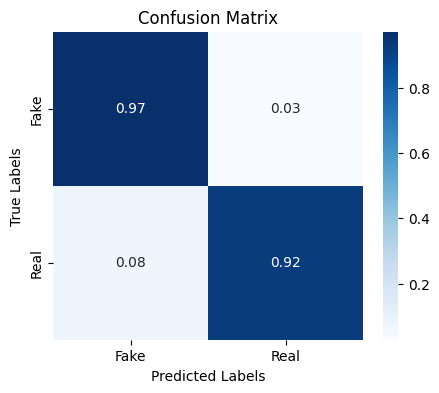

In [68]:
cm = cm.astype('float')/cm.sum(axis=1)[:, np.newaxis]
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues', xticklabels=dffd_test.class_names, yticklabels=dffd_test.class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

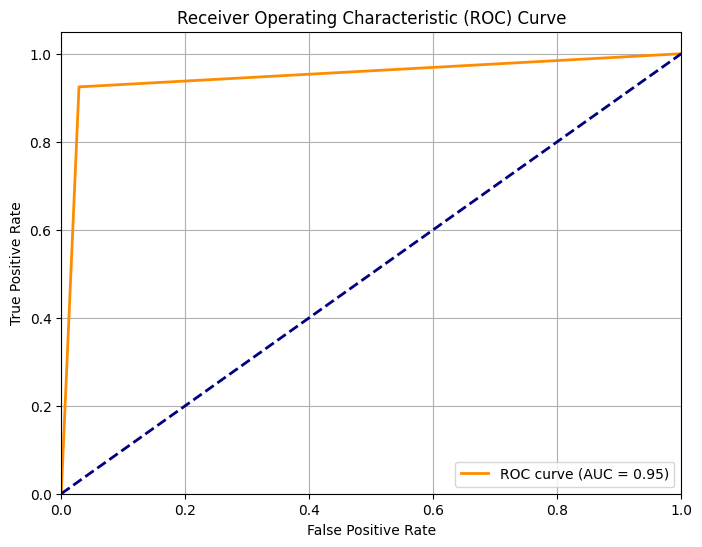

In [69]:
from sklearn.metrics import roc_curve, auc

fpr, tpr, thresholds = roc_curve(true_labels, predictions)

# Compute the AUC
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Random classifier
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.savefig('/kaggle/working/ROC.pdf')
plt.show()

# **Working on Sample Dataset**

In [39]:
import os
import shutil
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define dataset path
dataset_dir = '/kaggle/input/star-gan/Star_Test'  # Replace with the path to your dataset
base_dir = '/kaggle/working/split_dataset'  # Path where split datasets will be saved

# Parameters
train_ratio = 0.8
validation_ratio = 0.1
test_ratio = 0.1
img_height, img_width = 128, 128
batch_size = 32

# Create directories for train, validation, and test sets
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

# Function to split dataset
def split_dataset(dataset_dir, train_dir, validation_dir, test_dir, train_ratio, validation_ratio):
    if not os.path.exists(base_dir):
        os.makedirs(base_dir)
    if not os.path.exists(train_dir):
        os.makedirs(train_dir)
    if not os.path.exists(validation_dir):
        os.makedirs(validation_dir)
    if not os.path.exists(test_dir):
        os.makedirs(test_dir)

    for class_name in os.listdir(dataset_dir):
        class_dir = os.path.join(dataset_dir, class_name)
        if not os.path.isdir(class_dir):
            continue

        # Create class subdirectories
        train_class_dir = os.path.join(train_dir, class_name)
        validation_class_dir = os.path.join(validation_dir, class_name)
        test_class_dir = os.path.join(test_dir, class_name)

        os.makedirs(train_class_dir, exist_ok=True)
        os.makedirs(validation_class_dir, exist_ok=True)
        os.makedirs(test_class_dir, exist_ok=True)

        # Shuffle and split files
        files = os.listdir(class_dir)
        random.shuffle(files)
        num_train = int(train_ratio * len(files))
        num_val = int(validation_ratio * len(files))

        train_files = files[:num_train]
        val_files = files[num_train:num_train + num_val]
        test_files = files[num_train + num_val:]

        # Move files to respective directories
        for file in train_files:
            shutil.copy(os.path.join(class_dir, file), os.path.join(train_class_dir, file))
        for file in val_files:
            shutil.copy(os.path.join(class_dir, file), os.path.join(validation_class_dir, file))
        for file in test_files:
            shutil.copy(os.path.join(class_dir, file), os.path.join(test_class_dir, file))

# Split the dataset
split_dataset(dataset_dir, train_dir, validation_dir, test_dir, train_ratio, validation_ratio)

In [40]:
def get_from_dir(dir):
    global path
    dir = os.path.join(path,dir)
    return tf.keras.utils.image_dataset_from_directory(dir,
           color_mode="rgb",
           batch_size=32,
           image_size=(128, 128))


path = "/kaggle/working/split_dataset"

train = get_from_dir("train")
test = get_from_dir("test")
val = get_from_dir("validation")

Found 11100 files belonging to 2 classes.
Found 1563 files belonging to 2 classes.
Found 1563 files belonging to 2 classes.


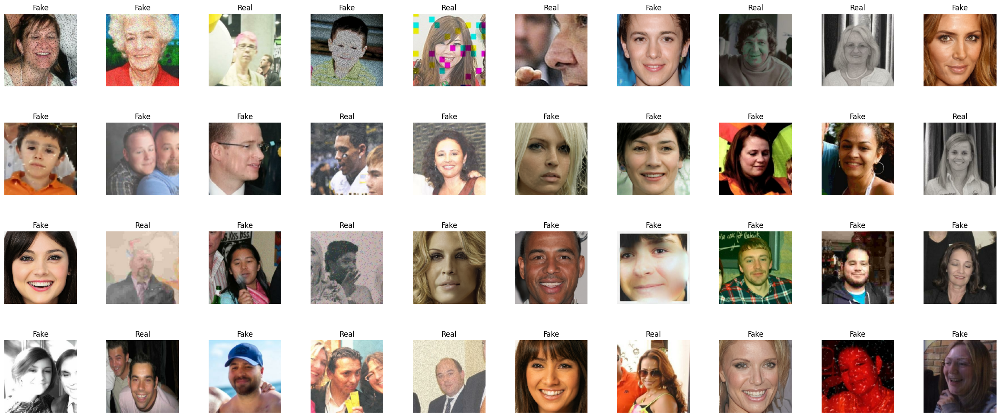

In [41]:
import numpy as np
from matplotlib import pyplot as plt

class_names = np.unique(train.class_names)

n_rows = 4
n_cols = 10
plt.figure(figsize=(n_cols * 3, n_rows * 3))
data = list(train.take(n_rows*n_cols))
for row in range(n_rows):
    for col in range(n_cols):
        index = n_cols * row + col
        
        single_image = data[index][0][0]  
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(single_image.numpy().astype("uint8"),cmap="gray")  
        plt.axis('off')
      
        label_index = data[index][1][0]
        plt.title(class_names[label_index], fontsize=12)
plt.subplots_adjust(wspace=0.2, hspace=0.5)
plt.show()

In [44]:
from keras.layers import Dense, Conv2D, MaxPooling2D, Input, Flatten, Dropout
from keras.models import Model

input1 =  Input((128, 128, 3))
x1 = Conv2D(32,(3,3),activation="relu", padding='same')(input1)
x2 = Conv2D(32,(3,3),activation="relu", padding='same')(x1)
m1 = MaxPooling2D((2,2), strides=(2, 2))(x2)

x3 = Conv2D(64,(3,3),activation="relu", padding='same')(m1)
x4 = Conv2D(64,(3,3),activation="relu", padding='same')(x3)
m2 = MaxPooling2D((2,2), strides=(2, 2))(x4)

x5 = Conv2D(128,(3,3),activation="relu", padding='same')(m2)
x6 = Conv2D(128,(3,3),activation="relu", padding='same')(x5)
m3 = MaxPooling2D((2,2), strides=(2, 2))(x6)

f = Flatten()(m3)
d1 = Dense(128,activation="relu")(f)
d1 = Dropout(0.5)(d1)
d2 = Dense(256,activation="relu")(d1)
d3 = Dense(1,activation="sigmoid")(d2)
model = Model(inputs=input1, outputs=d3)
model.summary()

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 128, 128, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_32 (Conv2D)              │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_33 (Conv2D)              │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_34 (Conv2D)              │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_35 (Conv2D)              │ (None, 32, 32, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 128)            │     4,194,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,514,721 (17.22 MB)

 Trainable params: 4,514,721 (17.22 MB)

 Non-trainable params: 0 (0.00 B)

In [46]:
import keras
model.compile('adam', loss=tf.keras.losses.BinaryCrossentropy(), metrics=['accuracy'])
history = model.fit(train, epochs=30, batch_size=32, validation_data=val,  shuffle  = True) #callbacks=[early_stopping_cb, checkpoint],

Epoch 1/30
347/347 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - accuracy: 0.6183 - loss: 1.5790 - val_accuracy: 0.7434 - val_loss: 0.5053
Epoch 2/30
347/347 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - accuracy: 0.7322 - loss: 0.4950 - val_accuracy: 0.7812 - val_loss: 0.4472
Epoch 3/30
347/347 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - accuracy: 0.7675 - loss: 0.4559 - val_accuracy: 0.7626 - val_loss: 0.4495
Epoch 4/30
347/347 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - accuracy: 0.7901 - loss: 0.4280 - val_accuracy: 0.8036 - val_loss: 0.3880
Epoch 5/30
347/347 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - accuracy: 0.8110 - loss: 0.3929 - val_accuracy: 0.8356 - val_loss: 0.3566
Epoch 6/30
347/347 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - accuracy: 0.8211 - loss: 0.3733 - val_accuracy: 0.8554 - val_loss: 0.3260
Epoch 7/30
347/347 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - accuracy: 0.8389 - loss: 0.3488 - val_accuracy: 0.8445 - val_loss: 0.3367
Epoch 8/30
347/347 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - accuracy: 0.8599 - loss: 0.3090 - 

In [47]:
loss, accuracy = model.evaluate(dffd_test)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

155/155 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - accuracy: 0.9926 - loss: 0.0369
Test Loss: 0.03450027480721474
Test Accuracy: 0.9923340678215027
